# Prepare Dataset and Basic Analysis

Datset I/O Infomation: https://huggingface.co/datasets/chabud-team/chabud-ecml-pkdd2023/tree/main

## Overview
1. Load Dataset
2. Save Data with MMseg Format
3. Visualize Satellite Image
4. Cross-validate Image
 

## Import 

In [1]:
import os, glob, random, time, gc
from tqdm import tqdm
from typing import List, Tuple

import numpy as np
import h5py
import pandas as pd
import seaborn as sns
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

SEED = 417
np.random.seed(SEED)
random.seed(SEED)

## Configuration

In [2]:
PATH_ROOT = os.path.join("..", "data")
PATH_DATASET = f"{PATH_ROOT}/train_eval.hdf5"
DATASET_NAME = '001_Fire_Only'
PATH_MMSEG_DATASET = f"{PATH_ROOT}/{DATASET_NAME}/"
FOLDS = 4

PATH_DATASET, PATH_MMSEG_DATASET, FOLDS

('../data/train_eval.hdf5', '../data/001_Fire_Only/', 4)

## Func
from official: https://huggingface.co/datasets/chabud-team/chabud-ecml-pkdd2023/blob/main/loader.py

- Numpy int32: https://numpy.org/doc/stable/user/basics.types.html
- Python Int: https://qiita.com/gomasa/items/f6337087988685d00ebb

Int 32Bit Max: `2147483647`

In [23]:
def loader(
    hdf5_file: str, DEBUG:bool=False
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, List[str]]:
    post = []
    pre = []
    masks = []
    names = []
    folds = []
    defects = []

    # Read hdf5 file and filter by fold
    with h5py.File(hdf5_file, "r") as f:
        for uuid, values in tqdm(f.items()):                
            
            post_img = values["post_fire"][...]
            post.append(post_img)
            
            if 'fold' in dict(values.attrs).keys():
                folds.append(values.attrs['fold'])
            else:
                folds.append(-1)
            
            if "pre_fire" not in values:
                pre.append(np.ones(post_img.shape, dtype=post_img.dtype))
                defects.append(True)
            else:
                pre.append(values["pre_fire"][...])
                defects.append(False)
                
            masks.append(values["mask"][:, :, 0])
            names.append(uuid)
            
            if DEBUG:
                print(values.keys(), uuid)
                break

    # Convert to numpy arrays
    post = np.stack(post, axis=0, dtype=np.int32)
    pre = np.stack(pre, axis=0, dtype=np.int32)
    masks = np.stack(masks, axis=0, dtype=np.int32)

    return post, pre, masks, names, folds, defects

# DEBUG
(img_post, img_pre, mask, names, folds, defects) = loader(hdf5_file=PATH_DATASET, DEBUG=True)

# size check
print(img_post.shape, img_pre.shape, mask.shape) # 12 channel 512x512 size

# data type check
print(img_post.dtype, img_pre.dtype, mask.dtype) # int32

folds

  0%|          | 0/534 [00:00<?, ?it/s]

<KeysViewHDF5 ['mask', 'post_fire', 'pre_fire']> 012b8863-976c-44e1-a491-9adf19c1cbba_0
(1, 512, 512, 12) (1, 512, 512, 12) (1, 512, 512)
int32 int32 int32


[1]

## Save the MMseg Format
- `img`
- `ann`

    same file name pare 

In [7]:
for _D in ['img', 'ann']:
    _PATH = os.path.join(PATH_MMSEG_DATASET, _D)
    print(_PATH)
    
    if not os.path.exists(_PATH):
        os.makedirs(_PATH)

../data/001_Fire_Only/img
../data/001_Fire_Only/ann


In [24]:
DEBUG = False

img_post, img_pre, mask, names, folds, defects = loader(hdf5_file=PATH_DATASET, DEBUG=DEBUG)


# Duplicate name check
num_unique = len(set(names))
print('NUM unique names:', num_unique)
assert num_unique == len(names), 'is Duplicated!!'

path_imgs, path_masks = [], []

# save feature
for (post, pre, mask, name, defect) in tqdm(zip(img_post, img_pre, mask, names, defects), total=len(names)):
    
    
    if defect:
        path_imgs.append('')
        path_masks.append('')
        continue
    
    features = np.concatenate([post, pre], axis=2) # H, W, C:24
    
    # save image
    _PATH_IMG = os.path.join(PATH_MMSEG_DATASET, 'img', name+'.npy')
    path_imgs.append(_PATH_IMG)
    if not os.path.exists(_PATH_IMG):
        np.save(_PATH_IMG, features)
    
    # save annotation
    _PATH_ANN = os.path.join(PATH_MMSEG_DATASET, 'ann', name+'.npy')
    path_masks.append(_PATH_ANN)
    if not os.path.exists(_PATH_ANN):
        np.save(_PATH_ANN, mask) # H, W
    
    if DEBUG:
        print(_PATH_IMG, _PATH_ANN, features.shape, mask.shape, sep='\n')
        break

100%|██████████| 534/534 [00:20<00:00, 25.57it/s]


NUM unique names: 534


100%|██████████| 534/534 [00:02<00:00, 219.65it/s]


In [25]:
df = pd.DataFrame({
    'name': names,
    'feature': path_imgs,
    'mask': path_masks,
    'defects': defects,
    'fold': folds,
})
df.head(3)

,name,feature,mask,defects,fold
0,012b8863-976c-44e1-a491-9adf19c1cbba_0,../data/001_Fire_Only/img/012b8863-976c-44e1-a...,../data/001_Fire_Only/ann/012b8863-976c-44e1-a...,False,1
1,0328d12a-4ad8-4504-8ac5-70089db10b4e_0,../data/001_Fire_Only/img/0328d12a-4ad8-4504-8...,../data/001_Fire_Only/ann/0328d12a-4ad8-4504-8...,False,4
2,0328d12a-4ad8-4504-8ac5-70089db10b4e_1,../data/001_Fire_Only/img/0328d12a-4ad8-4504-8...,../data/001_Fire_Only/ann/0328d12a-4ad8-4504-8...,False,4


In [27]:
df_sub = df[(df['fold'] == 0) & (df['defects'] == False)]
df_sub.describe()

,fold
count,78.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


In [13]:
# refine
# df = pd.read_csv(f"{PATH_MMSEG_DATASET}/001_seed{SEED}.csv")

## Visualize

Sentinel-2 Band: https://www.restec.or.jp/satellite/sentinel-2-a-2-b.html

- Inconsistent resolution

<Axes: xlabel='count', ylabel='defects'>

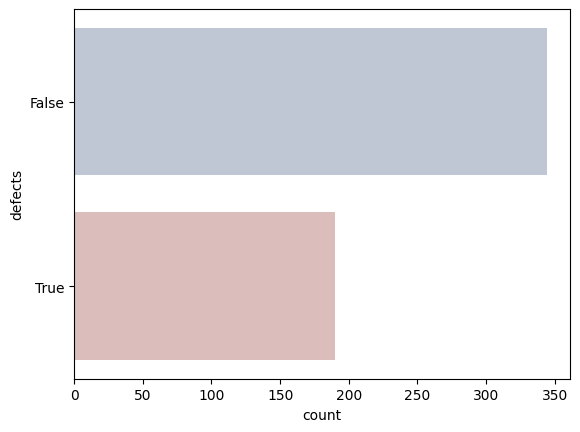

In [14]:
sns.countplot(y='defects', palette="vlag", data=df)

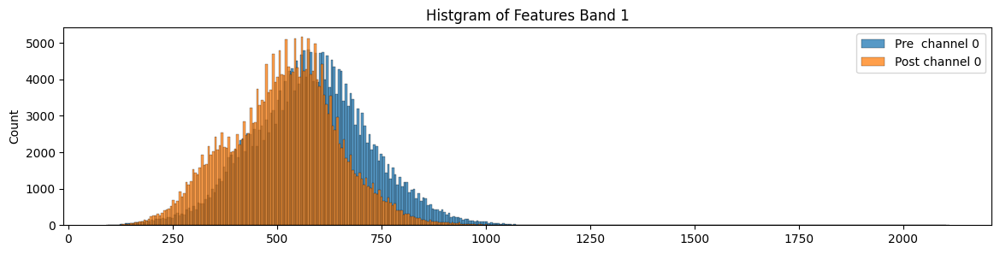

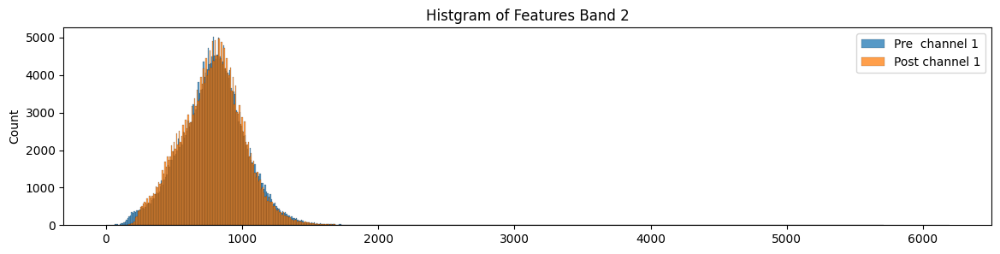

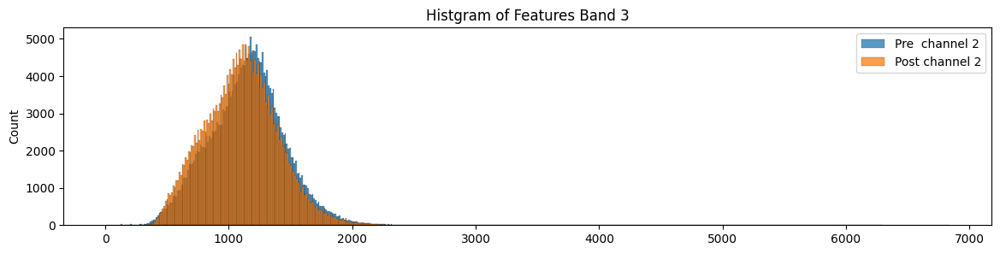

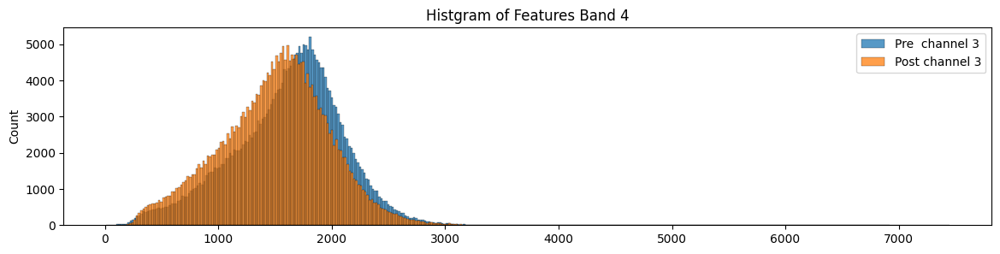

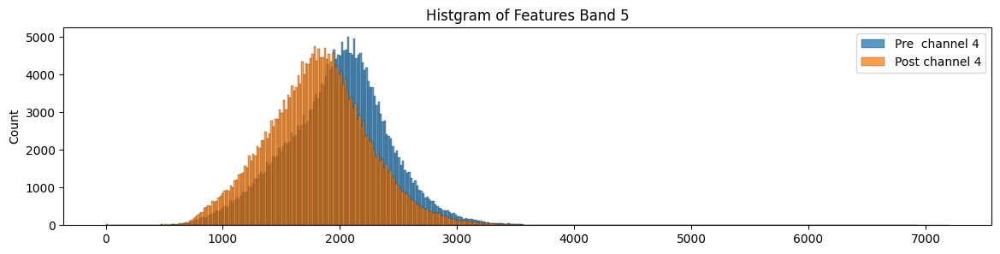

...

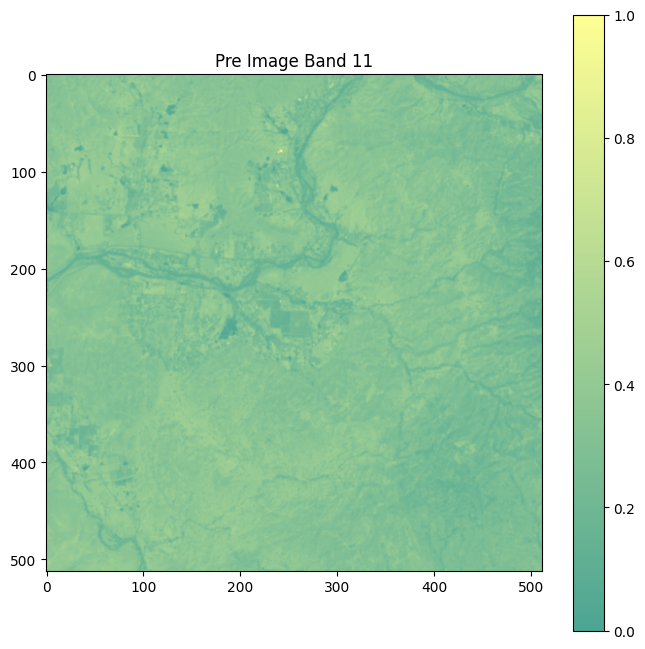

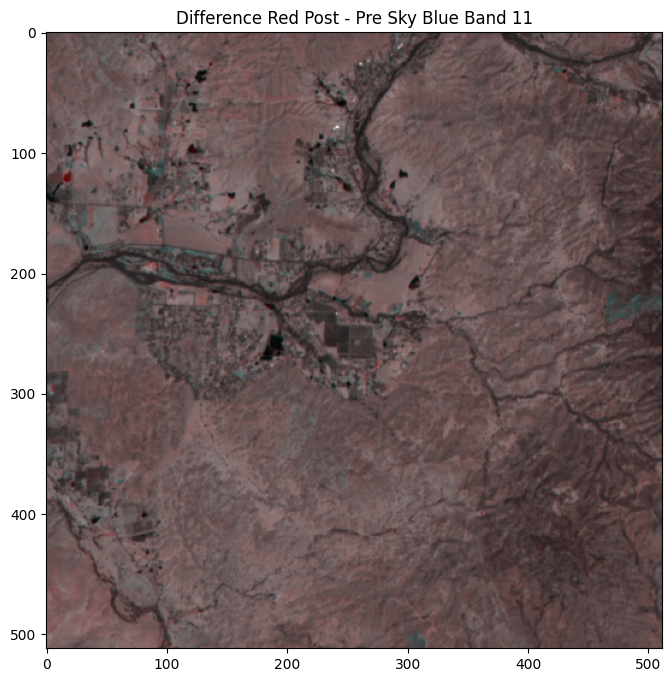

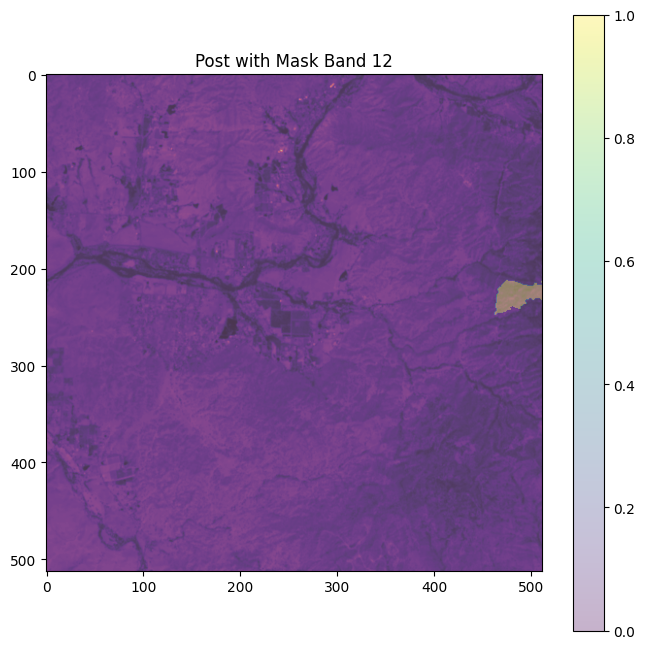

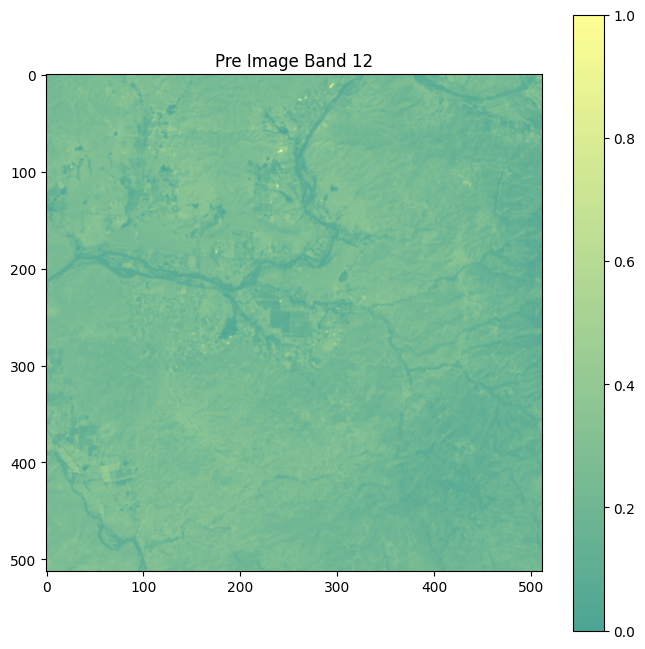

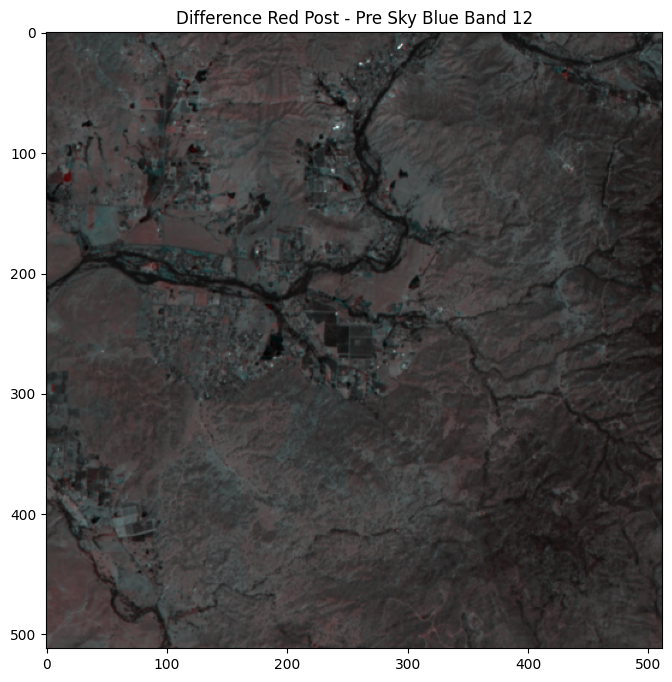

In [15]:
IDX = 1


PATH_IMG = df['feature'].iloc[IDX]
PATH_MSK = PATH_IMG.replace('img', 'ann')

features = np.load(PATH_IMG).astype(np.float32)
mask = np.load(PATH_MSK).astype(np.float32)

for num_band in range(12):
    plt.figure(figsize=(14, 3))
    plt.title(f'Histgram of Features Band {num_band+1}')
    sns.histplot(features[:, :, num_band].flatten(), label=f'Pre  channel {num_band}', )
    sns.histplot(features[:, :, num_band+12].flatten(), label=f'Post channel {num_band}', )
    plt.legend(loc='upper right')
    plt.show();

# minmax scale by band
for _c in range(12):
    features[:, :, _c] = (features[:, :, _c] - features[:, :, _c].min()) / (features[:, :, _c].max() - features[:, :, _c].min())
    features[:, :, _c+12] = (features[:, :, _c+12] - features[:, :, _c+12].min()) / (features[:, :, _c+12].max() - features[:, :, _c+12].min())
    
    plt.figure(figsize=(8, 8))
    plt.title(f'Post with Mask Band {_c+1}')
    plt.imshow(features[:, :, _c], alpha=0.7, cmap='magma')
    plt.imshow(mask, alpha=0.3)
    plt.colorbar()
    plt.show();
    
    plt.figure(figsize=(8, 8))
    plt.title(f'Pre Image Band {_c+1}')
    plt.imshow(features[:, :, _c+12], alpha=0.7, cmap='summer')
    plt.colorbar()
    plt.show();
    
    plt.figure(figsize=(8, 8))
    plt.title(f'Difference Red Post - Pre Sky Blue Band {_c+1}')
    plt.imshow(np.stack([features[:, :, _c], features[:, :, _c+12], features[:, :, _c+12]], axis=2))
    plt.show();
    
plt.clf()
plt.close()

## CV

<Axes: xlabel='cv', ylabel='count'>

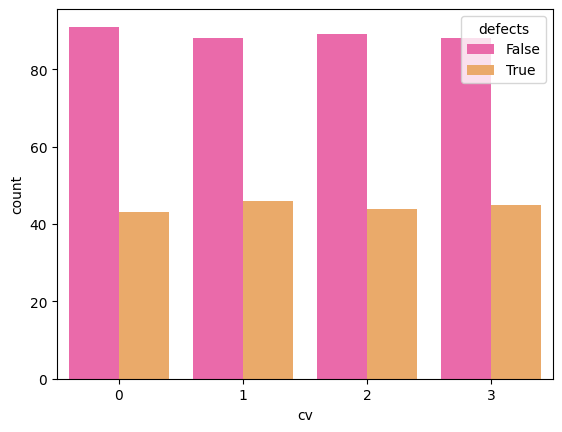

In [28]:
n_fold = np.zeros(len(df["name"]))
kf = KFold(n_splits=FOLDS, random_state=SEED, shuffle=True)
for k, (_, val_idx) in enumerate(kf.split(np.array(range(len(df["name"]))))):
    n_fold[val_idx] = k

df["cv"] = n_fold.astype(np.uint8)

sns.countplot(x='cv', palette="spring", data=df, hue='defects')

<Axes: xlabel='fold', ylabel='count'>

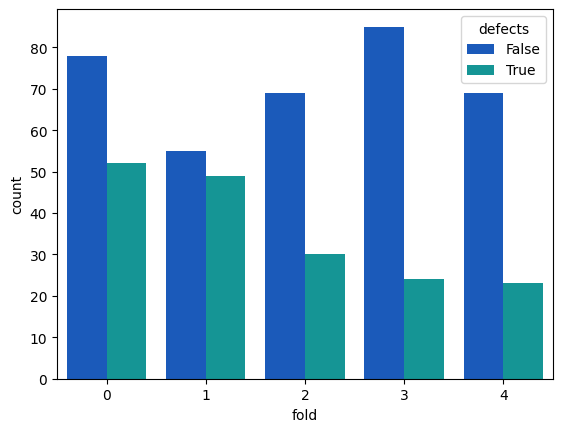

In [29]:
sns.countplot(x='fold', palette="winter", data=df, hue='defects')

In [30]:
df.to_csv(f"{PATH_MMSEG_DATASET}/001_seed{SEED}.csv", index=False, header=True)

In [31]:
df.head(10)

,name,feature,mask,defects,fold,cv
0,012b8863-976c-44e1-a491-9adf19c1cbba_0,../data/001_Fire_Only/img/012b8863-976c-44e1-a...,../data/001_Fire_Only/ann/012b8863-976c-44e1-a...,False,1,3
1,0328d12a-4ad8-4504-8ac5-70089db10b4e_0,../data/001_Fire_Only/img/0328d12a-4ad8-4504-8...,../data/001_Fire_Only/ann/0328d12a-4ad8-4504-8...,False,4,3
2,0328d12a-4ad8-4504-8ac5-70089db10b4e_1,../data/001_Fire_Only/img/0328d12a-4ad8-4504-8...,../data/001_Fire_Only/ann/0328d12a-4ad8-4504-8...,False,4,0
3,03790d1a-5b9c-48ed-820d-83abbe656035_0,../data/001_Fire_Only/img/03790d1a-5b9c-48ed-8...,../data/001_Fire_Only/ann/03790d1a-5b9c-48ed-8...,False,3,3
4,03790d1a-5b9c-48ed-820d-83abbe656035_1,../data/001_Fire_Only/img/03790d1a-5b9c-48ed-8...,../data/001_Fire_Only/ann/03790d1a-5b9c-48ed-8...,False,3,3
5,039885ad-e4f2-461e-9784-60508d0a7ab5_0,../data/001_Fire_Only/img/039885ad-e4f2-461e-9...,../data/001_Fire_Only/ann/039885ad-e4f2-461e-9...,False,1,1
6,039885ad-e4f2-461e-9784-60508d0a7ab5_1,../data/001_Fire_Only/img/039885ad-e4f2-461e-9...,../data/001_Fire_Only/ann/039885ad-e4f2-461e-9...,False,1,3
7,039885ad-e4f2-461e-9784-60508d0a7ab5_2,../data/001_Fire_Only/img/039885ad-e4f2-461e-9...,../data/001_Fire_Only/ann/039885ad-e4f2-461e-9...,False,1,0
8,039885ad-e4f2-461e-9784-60508d0a7ab5_3,../data/001_Fire_Only/img/039885ad-e4f2-461e-9...,../data/001_Fire_Only/ann/039885ad-e4f2-461e-9...,False,1,1
9,051de91d-9d50-423a-a130-4e51bd0d33f7_0,../data/001_Fire_Only/img/051de91d-9d50-423a-a...,../data/001_Fire_Only/ann/051de91d-9d50-423a-a...,False,4,0
